# Covid EDA (Exploratory Data Analysis)

In [13]:
import gc
import os
from pathlib import Path
import random
import sys

from tqdm.notebook import tqdm
import numpy as np
import pandas as pd
import scipy as sp


import matplotlib.pyplot as plt
import seaborn as sns

from IPython.core.display import display, HTML

# --- plotly ---
from plotly import tools, subplots
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
import plotly.io as pio
pio.templates.default = "plotly_dark"

# --- models ---
from sklearn import preprocessing
from sklearn.model_selection import KFold
import lightgbm as lgb
import xgboost as xgb

# --- setup ---
pd.set_option('max_columns', 50)

In [14]:
%%time
import requests

for filename in ['time_series_covid19_confirmed_global.csv',
                 'time_series_covid19_deaths_global.csv', 'time_series_covid19_recovered_global.csv',
                 'time_series_covid19_confirmed_US.csv', 'time_series_covid19_deaths_US.csv']:
    print(f'Downloading {filename}')
    url = f'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/{filename}'
    myfile = requests.get(url)
    open(filename, 'wb').write(myfile.content)

CPU times: user 74 ms, sys: 7.5 ms, total: 81.5 ms
Wall time: 887 ms


In [0]:
from datetime import datetime

def _convert_date_str(df):
    df.columns = list(df.columns[:4]) + [datetime.strptime(d, "%m/%d/%y").date().strftime("%Y-%m-%d") for d in df.columns[4:]]

confirmed_global_df = pd.read_csv('time_series_covid19_confirmed_global.csv')
_convert_date_str(confirmed_global_df)

deaths_global_df = pd.read_csv('time_series_covid19_deaths_global.csv')
_convert_date_str(deaths_global_df)

recovered_global_df = pd.read_csv('time_series_covid19_recovered_global.csv')
_convert_date_str(recovered_global_df)

In [0]:
# Filter out problematic data points (The West Bank and Gaza had a negative value, cruise ships were associated with Canada, etc.)
removed_states = "Recovered|Grand Princess|Diamond Princess"
removed_countries = "US|The West Bank and Gaza"

confirmed_global_df.rename(columns={"Province/State": "Province_State", "Country/Region": "Country_Region"}, inplace=True)
deaths_global_df.rename(columns={"Province/State": "Province_State", "Country/Region": "Country_Region"}, inplace=True)
recovered_global_df.rename(columns={"Province/State": "Province_State", "Country/Region": "Country_Region"}, inplace=True)

confirmed_global_df = confirmed_global_df[~confirmed_global_df["Province_State"].replace(np.nan, "nan").str.match(removed_states)]
deaths_global_df    = deaths_global_df[~deaths_global_df["Province_State"].replace(np.nan, "nan").str.match(removed_states)]
recovered_global_df = recovered_global_df[~recovered_global_df["Province_State"].replace(np.nan, "nan").str.match(removed_states)]

confirmed_global_df = confirmed_global_df[~confirmed_global_df["Country_Region"].replace(np.nan, "nan").str.match(removed_countries)]
deaths_global_df    = deaths_global_df[~deaths_global_df["Country_Region"].replace(np.nan, "nan").str.match(removed_countries)]
recovered_global_df = recovered_global_df[~recovered_global_df["Country_Region"].replace(np.nan, "nan").str.match(removed_countries)]

In [0]:
confirmed_global_melt_df = confirmed_global_df.melt(
    id_vars=['Country_Region', 'Province_State', 'Lat', 'Long'], value_vars=confirmed_global_df.columns[4:], var_name='Date', value_name='ConfirmedCases')
deaths_global_melt_df = deaths_global_df.melt(
    id_vars=['Country_Region', 'Province_State', 'Lat', 'Long'], value_vars=confirmed_global_df.columns[4:], var_name='Date', value_name='Deaths')
recovered_global_melt_df = deaths_global_df.melt(
    id_vars=['Country_Region', 'Province_State', 'Lat', 'Long'], value_vars=confirmed_global_df.columns[4:], var_name='Date', value_name='Recovered')

In [0]:
train = confirmed_global_melt_df.merge(deaths_global_melt_df, on=['Country_Region', 'Province_State', 'Lat', 'Long', 'Date'])
train = train.merge(recovered_global_melt_df, on=['Country_Region', 'Province_State', 'Lat', 'Long', 'Date'])

In [19]:
train

,Country_Region,Province_State,Lat,Long,Date,ConfirmedCases,Deaths,Recovered
0,Afghanistan,NaN,33.000000,65.000000,2020-01-22,0,0,0
1,Albania,NaN,41.153300,20.168300,2020-01-22,0,0,0
2,Algeria,NaN,28.033900,1.659600,2020-01-22,0,0,0
3,Andorra,NaN,42.506300,1.521800,2020-01-22,0,0,0
4,Angola,NaN,-11.202700,17.873900,2020-01-22,0,0,0
...,...,...,...,...,...,...,...,...
23655,France,Saint Pierre and Miquelon,46.885200,-56.315900,2020-04-21,1,0,0
23656,South Sudan,NaN,6.877000,31.307000,2020-04-21,4,0,0
23657,Western Sahara,NaN,24.215500,-12.885800,2020-04-21,6,0,0
23658,Sao Tome and Principe,NaN,0.186360,6.613081,2020-04-21,4,0,0


In [0]:
state = 'China'
date = '2020-04-21'

In [42]:
import folium 
from folium import plugins
plt.style.use("fivethirtyeight")# for pretty graphs


temp = train.loc[(train["Country_Region"]==state) & (train["Date"]==date)].groupby(["Province_State","Lat","Long"])["ConfirmedCases"].sum().reset_index()
map1 = folium.Map(location=[34, 100], zoom_start=3.5,tiles='Stamen Toner')

for lat, lon, value, name in zip(temp['Lat'], temp['Long'], temp['ConfirmedCases'], temp["Province_State"]):
    folium.CircleMarker([lat, lon],
                        radius=value*0.007,
                        color='red',
                        fill_color='red',
                        fill_opacity=0.3 ).add_to(map1)

map1

In [0]:
# Read in the data CSV files


train = pd.read_csv('https://frenzy86.s3.eu-west-2.amazonaws.com/fav/covid19/train.csv')
test = pd.read_csv('https://frenzy86.s3.eu-west-2.amazonaws.com/fav/covid19/test.csv')
submission = pd.read_csv('https://frenzy86.s3.eu-west-2.amazonaws.com/fav/covid19/submission.csv')


In [9]:
train

,Id,Province_State,Country_Region,Date,ConfirmedCases,Fatalities
0,1,NaN,Afghanistan,2020-01-22,0.0,0.0
1,2,NaN,Afghanistan,2020-01-23,0.0,0.0
2,3,NaN,Afghanistan,2020-01-24,0.0,0.0
3,4,NaN,Afghanistan,2020-01-25,0.0,0.0
4,5,NaN,Afghanistan,2020-01-26,0.0,0.0
...,...,...,...,...,...,...
27226,35651,NaN,Zimbabwe,2020-04-13,17.0,3.0
27227,35652,NaN,Zimbabwe,2020-04-14,17.0,3.0
27228,35653,NaN,Zimbabwe,2020-04-15,23.0,3.0
27229,35654,NaN,Zimbabwe,2020-04-16,23.0,3.0


In [0]:
train.rename({'Country_Region': 'country', 'Province_State': 'province', 'Id': 'id', 'Date': 'date', 'ConfirmedCases': 'confirmed', 'Fatalities': 'fatalities', 'Recovered': 'recovered'}, axis=1, inplace=True)
test.rename({'Country_Region': 'country', 'Province_State': 'province', 'Id': 'id', 'Date': 'date', 'ConfirmedCases': 'confirmed', 'Fatalities': 'fatalities'}, axis=1, inplace=True)
train['country_province'] = train['country'].fillna('') + '/' + train['province'].fillna('')
test['country_province'] = test['country'].fillna('') + '/' + test['province'].fillna('')

## Worldwide trend

In [0]:
ww_df = train.groupby('date')[['confirmed', 'fatalities']].sum().reset_index()
ww_df['new_case'] = ww_df['confirmed'] - ww_df['confirmed'].shift(1)
ww_df.tail()

,date,confirmed,fatalities,new_case
82,2020-04-13,1904662.0,119480.0,70117.0
83,2020-04-14,1976015.0,125982.0,71353.0
84,2020-04-15,2055876.0,134175.0,79861.0
85,2020-04-16,2152468.0,143799.0,96592.0
86,2020-04-17,2240012.0,153820.0,87544.0


In [0]:
ww_melt_df = pd.melt(ww_df, id_vars=['date'], value_vars=['confirmed', 'fatalities', 'new_case'])
ww_melt_df

,date,variable,value
0,2020-01-22,confirmed,554.0
1,2020-01-23,confirmed,653.0
2,2020-01-24,confirmed,939.0
3,2020-01-25,confirmed,1432.0
4,2020-01-26,confirmed,2113.0
...,...,...,...
256,2020-04-13,new_case,70117.0
257,2020-04-14,new_case,71353.0
258,2020-04-15,new_case,79861.0
259,2020-04-16,new_case,96592.0


When we see the confirmed cases in world wide, it just look like exponential growth curve. The number is increasing very rapidly especially recently. the number almost doubled in last 1 week...

Confirmed cases reached 593K people, and 27K people already died on March 27.
Confirmed cases reached 1M people, and 52K people already died on April 2.

Good news! Daily new confirmed cases start to decrease from April 4, I hope this trend will continue..

In [0]:
######################## NECESSARY TO WORK WITH COLAB for plotly ###################
#########################################################################

def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

###

In [0]:
configure_plotly_browser_state
import IPython

In [0]:
IPython.get_ipython().events.register('pre_run_cell', configure_plotly_browser_state)

In [0]:
fig = px.line(ww_melt_df, x="date", y="value", color='variable', 
              title="Worldwide Confirmed/Death Cases Over Time")
fig.show()

Moreover, when we check the growth in log-scale below figure, we can see that the speed of confirmed cases growth rate slightly increases when compared with the beginning of March and end of March.
In spite of the Lockdown policy in Europe or US, the number is still increasing rapidly.

In [0]:
fig = px.line(ww_melt_df, x="date", y="value", color='variable',
              title="Worldwide Confirmed/Death Cases Over Time (Log scale)",
             log_y=True)
fig.show()

It looks like fatalities curve is just shifted the confirmed curve to below in log-scale, which means mortality rate is almost constant.

Is it true? Let's see mortality rate in detail.
We see that mortality rate is kept almost 3%, however it is slightly increasing gradually to go over 6% at the middle of April.

Why? I will show you later that Europe & US has more seriously infected by Coronavirus recently, and mortality rate is high in these regions.
It might be because when too many people get coronavirus, the country cannot provide enough medical treatment.

In [0]:
ww_df['mortality'] = ww_df['fatalities'] / ww_df['confirmed']

fig = px.line(ww_df, x="date", y="mortality", 
              title="Worldwide Mortality Rate Over Time")
fig.show()

##  Country-wise growth

In [0]:
country_df = train.groupby(['date', 'country'])[['confirmed', 'fatalities']].sum().reset_index()
country_df.tail()

,date,country,confirmed,fatalities
16003,2020-04-17,Vietnam,268.0,0.0
16004,2020-04-17,West Bank and Gaza,402.0,2.0
16005,2020-04-17,Western Sahara,6.0,0.0
16006,2020-04-17,Zambia,52.0,2.0
16007,2020-04-17,Zimbabwe,24.0,3.0


In [0]:
countries = country_df['country'].unique()
print(f'{len(countries)} countries are in dataset:\n{countries}')

184 countries are in dataset:
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia' 'Bosnia and Herzegovina'
 'Botswana' 'Brazil' 'Brunei' 'Bulgaria' 'Burkina Faso' 'Burma' 'Burundi'
 'Cabo Verde' 'Cambodia' 'Cameroon' 'Canada' 'Central African Republic'
 'Chad' 'Chile' 'China' 'Colombia' 'Congo (Brazzaville)'
 'Congo (Kinshasa)' 'Costa Rica' "Cote d'Ivoire" 'Croatia' 'Cuba' 'Cyprus'
 'Czechia' 'Denmark' 'Diamond Princess' 'Djibouti' 'Dominica'
 'Dominican Republic' 'Ecuador' 'Egypt' 'El Salvador' 'Equatorial Guinea'
 'Eritrea' 'Estonia' 'Eswatini' 'Ethiopia' 'Fiji' 'Finland' 'France'
 'Gabon' 'Gambia' 'Georgia' 'Germany' 'Ghana' 'Greece' 'Grenada'
 'Guatemala' 'Guinea' 'Guinea-Bissau' 'Guyana' 'Haiti' 'Holy See'
 'Honduras' 'Hungary' 'Iceland' 'India' 'Indonesia' 'Iran' 'Iraq'
 'Ireland' 'Israel' 'Italy' '

In [0]:
target_date = country_df['date'].max()

print('Date: ', target_date)
for i in [1, 10, 100, 1000, 10000]:
    n_countries = len(country_df.query('(date == @target_date) & confirmed > @i'))
    print(f'{n_countries} countries have more than {i} confirmed cases')

Date:  2020-04-17
184 countries have more than 1 confirmed cases
172 countries have more than 10 confirmed cases
128 countries have more than 100 confirmed cases
76 countries have more than 1000 confirmed cases
23 countries have more than 10000 confirmed cases


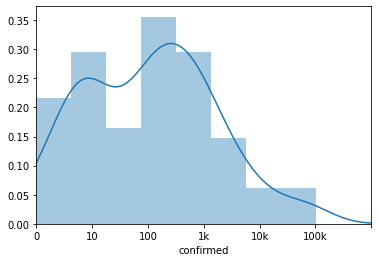

In [0]:
ax = sns.distplot(np.log10(country_df.query('date == "2020-03-27"')['confirmed'] + 1))
ax.set_xlim([0, 6])
ax.set_xticks(np.arange(7))
_ = ax.set_xticklabels(['0', '10', '100', '1k', '10k', '100k'])

In [0]:
top_country_df = country_df.query('(date == @target_date) & (confirmed > 1000)').sort_values('confirmed', ascending=False)
top_country_melt_df = pd.melt(top_country_df, id_vars='country', value_vars=['confirmed', 'fatalities'])

Now US, Italy and Spain has more confirmed cases than China, and we can see many Europe countries in the top.

Korea also appears in relatively top despite of its population, this is because Korea execcutes inspection check aggressively.

In [0]:
fig = px.bar(top_country_melt_df.iloc[::-1],
             x='value', y='country', color='variable', barmode='group',
             title=f'Confirmed Cases/Deaths on {target_date}', text='value', height=1500, orientation='h')
fig.show()

Let's check these major country's growth by date.

As we can see, Coronavirus hit China at first but its trend is slowing down in March which is good news.
Bad news is 2nd wave comes to Europe (Italy, Spain, Germany, France, UK) at March.
But more sadly 3rd wave now comes to US, whose growth rate is much much faster than China, or even Europe. Its main spread starts from middle of March and its speed is faster than Italy. Now US seems to be in the most serious situation in terms of both total number and spread speed.

In [0]:
top30_countries = top_country_df.sort_values('confirmed', ascending=False).iloc[:30]['country'].unique()
top30_countries_df = country_df[country_df['country'].isin(top30_countries)]
fig = px.line(top30_countries_df,
              x='date', y='confirmed', color='country',
              title=f'Confirmed Cases for top 30 country as of {target_date}')
fig.show()

In terms of number of fatalities, Europe & US are serious situation now.
6 countries, US, Italy, Spain, France, UK, Iran have more fatalities than China.

US's spread speed is the fastest, US's fatality cases become top1 on Apr 10th.

In [0]:
top30_countries = top_country_df.sort_values('fatalities', ascending=False).iloc[:30]['country'].unique()
top30_countries_df = country_df[country_df['country'].isin(top30_countries)]
fig = px.line(top30_countries_df,
              x='date', y='fatalities', color='country',
              title=f'Fatalities for top 30 country as of {target_date}')
fig.show()

Now let's see mortality rate by country

In [0]:
top_country_df = country_df.query('(date == @target_date) & (confirmed > 100)')
top_country_df['mortality_rate'] = top_country_df['fatalities'] / top_country_df['confirmed']
top_country_df = top_country_df.sort_values('mortality_rate', ascending=False)

Italy is the most serious situation, whose mortality rate is over 10% as of 2020/3/28.
We can also find countries from all over the world when we see top mortality rate countries.
Iran/Iraq from Middle East, Phillipines & Indonesia from tropical areas.
Spain, Netherlands, France, and UK form Europe etc. It shows this coronavirus is really world wide pandemic.

[UPDATE]: According to the comment by @elettra84, 10% of Italy is due to extreme outlier of Lombardy cluster. Except that mortality rate in Italy is comparable to other country. Refer Lombardy cluster in wikipedia.

In [0]:
fig = px.bar(top_country_df[:30].iloc[::-1],
             x='mortality_rate', y='country',
             title=f'Mortality rate HIGH: top 30 countries on {target_date}', text='mortality_rate', height=800, orientation='h')
fig.show()

How about the countries whose mortality rate is low?

By investigating the difference between above & below countries, we might be able to figure out what is the cause which leads death.
Be careful that there may be a case that these country's mortality rate is low due to these country does not report/measure fatality cases properly.

In [0]:
fig = px.bar(top_country_df[-30:],
             x='mortality_rate', y='country',
             title=f'Mortality rate LOW: top 30 countries on {target_date}', text='mortality_rate', height=800, orientation='h')
fig.show()

Let's see number of confirmed cases on map. Again we can see Europe, US, MiddleEast (Turkey, Iran) and Asia (China, Korea) are red.

In [0]:
all_country_df = country_df.query('date == @target_date')
all_country_df['confirmed_log1p'] = np.log10(all_country_df['confirmed'] + 1)
all_country_df['fatalities_log1p'] = np.log10(all_country_df['fatalities'] + 1)
all_country_df['mortality_rate'] = all_country_df['fatalities'] / all_country_df['confirmed']

In [0]:
fig = px.choropleth(all_country_df, locations="country", 
                    locationmode='country names', color="confirmed_log1p", 
                    hover_name="country", hover_data=["confirmed", 'fatalities', 'mortality_rate'],
                    range_color=[all_country_df['confirmed_log1p'].min(), all_country_df['confirmed_log1p'].max()], 
                    color_continuous_scale="peach", 
                    title='Countries with Confirmed Cases')

# I'd like to update colorbar to show raw values, but this does not work somehow...
# Please let me know if you know how to do this!!
trace1 = list(fig.select_traces())[0]
trace1.colorbar = go.choropleth.ColorBar(
    tickvals=[0, 1, 2, 3, 4, 5],
    ticktext=['1', '10', '100', '1000','10000', '10000'])
fig.show()

When we see mortality rate on map, we see Europe (especaiily Italy) is high. Also we notice MiddleEast (Iran, Iraq) is high.

When we see tropical area, I wonder why Phillipines and Indonesia are high while other countries (Malaysia, Thai, Vietnam, as well as Australia) are low.

For Asian region, Korea's mortality rate is lower than China or Japan, I guess this is due to the fact that number of inspection is quite many in Korea. Please refer these blogs for detail:

South Korea launches 'drive-thru' coronavirus testing facilities as demand soars
Coronavirus: Why Japan tested so few people

In [0]:

fig = px.choropleth(all_country_df, locations="country", 
                    locationmode='country names', color="fatalities_log1p", 
                    hover_name="country", range_color=[0, 4],
                    hover_data=['confirmed', 'fatalities', 'mortality_rate'],
                    color_continuous_scale="peach", 
                    title='Countries with fatalities')
fig.show()

In [0]:
fig = px.choropleth(all_country_df, locations="country", 
                    locationmode='country names', color="mortality_rate", 
                    hover_name="country", range_color=[0, 0.12], 
                    color_continuous_scale="peach", 
                    title='Countries with mortality rate')
fig.show()

Why mortality rate is different among country? What kind of hint is hidden in this map? Especially mortality rate is high in Europe and US, is there some reasons?

There is one interesting hypothesis that BCG vaccination
The below figure shows BCG vaccination policy by country: Advanced countries like Europe & US, especially Italy and US does not take BCG vaccination. We can notice this map is indeed similar to mortality rate map above. Is it just accidental?

The below figure shows BCG vaccination policy by country: Advanced countries like Europe & US, especially Italy and US does not take BCG vaccination. We can notice this map is indeed similar to mortality rate map above. Is it just accidental?

![](https://www.researchgate.net/profile/Alice_Zwerling/publication/50892386/figure/fig2/AS:277209752326147@1443103363144/Map-displaying-BCG-vaccination-policy-by-country-A-The-country-currently-has-universal.png)

Reference: [If I were North American/West European/Australian, I will take BCG vaccination now against the novel coronavirus pandemic.](https://www.jsatonotes.com/2020/03/if-i-were-north-americaneuropeanaustral.html)

 - [Australia's Trialing a TB Vaccine Against COVID-19, And Health Workers Get It First](https://www.sciencealert.com/australia-is-trialling-a-tb-vaccine-for-coronavirus-and-health-workers-get-it-first)

Of course this is just one hypothesis but we can notice/find some hints to tackle Coronavirus like this by carefully analyzing/comparing the data.

The figure showing fatality growth since 10 deaths.

Ref: COVID-19 Deaths Per Capita

In [0]:
n_countries = 20
n_start_death = 10
fatality_top_countires = top_country_df.sort_values('fatalities', ascending=False).iloc[:n_countries]['country'].values
country_df['date'] = pd.to_datetime(country_df['date'])


df_list = []
for country in fatality_top_countires:
    this_country_df = country_df.query('country == @country')
    start_date = this_country_df.query('fatalities > @n_start_death')['date'].min()
    this_country_df = this_country_df.query('date >= @start_date')
    this_country_df['date_since'] = this_country_df['date'] - start_date
    this_country_df['fatalities_log1p'] = np.log10(this_country_df['fatalities'] + 1)
    this_country_df['fatalities_log1p'] -= this_country_df['fatalities_log1p'].values[0]
    df_list.append(this_country_df)

tmpdf = pd.concat(df_list)
tmpdf['date_since_days'] = tmpdf['date_since'] / pd.Timedelta('1 days')

In [0]:
fig = px.line(tmpdf,
              x='date_since_days', y='fatalities_log1p', color='country',
              title=f'Fatalities by country since 10 deaths, as of {target_date}')
fig.add_trace(go.Scatter(x=[0, 21], y=[0, 3], name='Double by 7 days', line=dict(dash='dash', color=('rgb(200, 200, 200)'))))
fig.add_trace(go.Scatter(x=[0, 42], y=[0, 3], name='Double by 14 days', line=dict(dash='dash', color=('rgb(200, 200, 200)'))))
fig.add_trace(go.Scatter(x=[0, 63], y=[0, 3], name='Double by 21 days', line=dict(dash='dash', color=('rgb(200, 200, 200)'))))
fig.show()

Daily NEW confirmed cases trend
How about DAILY new cases trend?
We find from below figure:

China has finished its peak at Feb 14, new confirmed cases are surpressed now.
Europe&US spread starts on mid of March, after China slows down.
I feel effect of lock down policy in Europe (Italy, Spain, Germany, France) now comes on the figure, the number of new cases are not so increasing rapidly at the end of March.
Current US new confirmed cases are the worst speed, recording worst speed at more than 30k people/day at peak. Daily new confirmed cases start to decrease from April 4 or April 10, I hope this trend will continue..

In [0]:
country_df['prev_confirmed'] = country_df.groupby('country')['confirmed'].shift(1)
country_df['new_case'] = country_df['confirmed'] - country_df['prev_confirmed']
country_df['new_case'].fillna(0, inplace=True)
top30_country_df = country_df[country_df['country'].isin(top30_countries)]

fig = px.line(top30_country_df,
              x='date', y='new_case', color='country',
              title=f'DAILY NEW Confirmed cases world wide')
fig.show()

Geographical animation: spready by date
You can see animation how confirmed cases spread over time, you can see trend moving to China -> Europe -> US.

In [0]:
country_df['date'] = country_df['date'].apply(str)
country_df['confirmed_log1p'] = np.log1p(country_df['confirmed'])
country_df['fatalities_log1p'] = np.log1p(country_df['fatalities'])

fig = px.scatter_geo(country_df, locations="country", locationmode='country names', 
                     color="confirmed", size='confirmed', hover_name="country", 
                     hover_data=['confirmed', 'fatalities'],
                     range_color= [0, country_df['confirmed'].max()], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Confirmed cases spread Over Time', color_continuous_scale="portland")
# fig.update(layout_coloraxis_showscale=False)
fig.show()

You can see animation how confirmed cases spread over time, you can see trend moving to China -> Europe -> US. But Europe is worse than US for number of fatalities now.

In [0]:
fig = px.scatter_geo(country_df, locations="country", locationmode='country names', 
                     color="fatalities", size='fatalities', hover_name="country", 
                     hover_data=['confirmed', 'fatalities'],
                     range_color= [0, country_df['fatalities'].max()], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Fatalities growth Over Time', color_continuous_scale="portland")
fig.show()

New cases trend: it looks like China is almost converged now.

In [0]:
country_df.loc[country_df['new_case'] < 0, 'new_case'] = 0.
fig = px.scatter_geo(country_df, locations="country", locationmode='country names', 
                     color="new_case", size='new_case', hover_name="country", 
                     hover_data=['confirmed', 'fatalities'],
                     range_color= [0, country_df['new_case'].max()], 
                     projection="natural earth", animation_frame="date", 
                     title='COVID-19: Daily NEW cases over Time', color_continuous_scale="portland")
fig.show()


**Going into province**

How many country has precise province information?
It seems it's 8 countries: Australia, Canada, China, Denmark, France, Netherlands, US, and UK.

In [0]:
for country in countries:
    province = train.query('country == @country')['province'].unique()
    if len(province) > 1:       
        print(f'Country {country} has {len(province)} provinces: {province}')

Country Australia has 8 provinces: ['Australian Capital Territory' 'New South Wales' 'Northern Territory'
 'Queensland' 'South Australia' 'Tasmania' 'Victoria' 'Western Australia']
Country Canada has 12 provinces: ['Alberta' 'British Columbia' 'Manitoba' 'New Brunswick'
 'Newfoundland and Labrador' 'Northwest Territories' 'Nova Scotia'
 'Ontario' 'Prince Edward Island' 'Quebec' 'Saskatchewan' 'Yukon']
Country China has 33 provinces: ['Anhui' 'Beijing' 'Chongqing' 'Fujian' 'Gansu' 'Guangdong' 'Guangxi'
 'Guizhou' 'Hainan' 'Hebei' 'Heilongjiang' 'Henan' 'Hong Kong' 'Hubei'
 'Hunan' 'Inner Mongolia' 'Jiangsu' 'Jiangxi' 'Jilin' 'Liaoning' 'Macau'
 'Ningxia' 'Qinghai' 'Shaanxi' 'Shandong' 'Shanghai' 'Shanxi' 'Sichuan'
 'Tianjin' 'Tibet' 'Xinjiang' 'Yunnan' 'Zhejiang']
Country Denmark has 3 provinces: ['Faroe Islands' 'Greenland' nan]
Country France has 11 provinces: ['French Guiana' 'French Polynesia' 'Guadeloupe' 'Martinique' 'Mayotte'
 'New Caledonia' 'Reunion' 'Saint Barthelemy' 'Saint P

# USA

Zoom up to US: what is happening in US now??
As we can see, the spread is fastest in US now, at the end of March. Let's see in detail what is going on in US.

In [0]:
usa_state_code_df = pd.read_csv('https://frenzy86.s3.eu-west-2.amazonaws.com/fav/covid19/usa_states2.csv')

In [0]:
train_us = train.query('country == "US"')


In [0]:
train_us['mortality_rate'] = train_us['fatalities'] / train_us['confirmed']

# Convert province column to its 2-char code name,
state_name_to_code = dict(zip(usa_state_code_df['state_name'], usa_state_code_df['state_code']))
train_us['province_code'] = train_us['province'].map(state_name_to_code)

# Only show latest days.
train_us_latest = train_us.query('date == @target_date')

When we see inside of the US, we can see only New York, and its neighbor New Jersey dominates its spread and are in serious situation.

New York confirmed cases is over 50k, while other states are less than about 5k confirmed cases.

In [0]:
fig = px.choropleth(train_us_latest, locations='province_code', locationmode="USA-states",
                    color='confirmed', scope="usa", hover_data=['province', 'fatalities', 'mortality_rate'],
                    title=f'Confirmed cases in US on {target_date}')
fig.show()

In [0]:
train_us_latest.sort_values('confirmed', ascending=False)

,id,province,country,date,confirmed,fatalities,country_province,mortality_rate,province_code
23576,30867,New York,US,2020-04-17,230597.0,17131.0,US/New York,0.074290,NY
23402,30639,New Jersey,US,2020-04-17,78467.0,3840.0,US/New Jersey,0.048938,NJ
22619,29613,Massachusetts,US,2020-04-17,34402.0,1245.0,US/Massachusetts,0.036190,MA
22706,29727,Michigan,US,2020-04-17,30023.0,2227.0,US/Michigan,0.074176,MI
24098,31551,Pennsylvania,US,2020-04-17,29888.0,921.0,US/Pennsylvania,0.030815,PA
21053,27561,California,US,2020-04-17,29157.0,1037.0,US/California,0.035566,CA
21923,28701,Illinois,US,2020-04-17,27578.0,1132.0,US/Illinois,0.041047,IL
21488,28131,Florida,US,2020-04-17,24759.0,725.0,US/Florida,0.029282,FL
22358,29271,Louisiana,US,2020-04-17,23118.0,1213.0,US/Louisiana,0.052470,LA
24620,32235,Texas,US,2020-04-17,17849.0,451.0,US/Texas,0.025268,TX


In [0]:
fig = px.choropleth(train_us_latest, locations='province_code', locationmode="USA-states",
                    color='mortality_rate', scope="usa", hover_data=['province', 'fatalities', 'mortality_rate'],
                    title=f'Mortality rate in US on {target_date}')
fig.show()

Daily growth: All state is US got affected from middle of March, and now growing exponentially. In New York, less than 1k people are confirmed on March 16, but more than 50k people are confirmed on March 30. 50 times explosion in 2 weeks!

In [0]:
train_us_march = train_us.query('date > "2020-03-01"')
fig = px.line(train_us_march,
              x='date', y='confirmed', color='province',
              title=f'Confirmed cases by state in US, as of {target_date}')
fig.show()

# Europe

In [0]:
# Ref: https://www.kaggle.com/abhinand05/covid-19-digging-a-bit-deeper
europe_country_list =list([
    'Austria','Belgium','Bulgaria','Croatia','Cyprus','Czechia','Denmark','Estonia','Finland','France','Germany','Greece','Hungary','Ireland',
    'Italy', 'Latvia','Luxembourg','Lithuania','Malta','Norway','Netherlands','Poland','Portugal','Romania','Slovakia','Slovenia',
    'Spain', 'Sweden', 'United Kingdom', 'Iceland', 'Russia', 'Switzerland', 'Serbia', 'Ukraine', 'Belarus',
    'Albania', 'Bosnia and Herzegovina', 'Kosovo', 'Moldova', 'Montenegro', 'North Macedonia'])

country_df['date'] = pd.to_datetime(country_df['date'])
train_europe = country_df[country_df['country'].isin(europe_country_list)]
#train_europe['date_str'] = pd.to_datetime(train_europe['date'])
train_europe_latest = train_europe.query('date == @target_date')

When we look into the Europe, its Northern & Eastern areas are relatively better situation compared to Eastern & Southern areas.

In [0]:
fig = px.choropleth(train_europe_latest, locations="country", 
                    locationmode='country names', color="confirmed", 
                    hover_name="country", range_color=[1, train_europe_latest['confirmed'].max()], 
                    color_continuous_scale='portland', 
                    title=f'European Countries with Confirmed Cases as of {target_date}', scope='europe', height=800)
fig.show()

Especially Italy, Spain, German, France are in more serious situation.

In [0]:
train_europe_march = train_europe.query('date >= "2020-03-01"')
fig = px.line(train_europe_march,
              x='date', y='confirmed', color='country',
              title=f'Confirmed cases by country in Europe, as of {target_date}')
fig.show()

In [0]:
fig = px.line(train_europe_march,
              x='date', y='fatalities', color='country',
              title=f'Fatalities by country in Europe, as of {target_date}')
fig.show()

When we check daily new cases in Europe, we notice:

Spain, Germany, France daily growth are more than Italy now, UK is also reaching to Italy. These 4 countries are potentially more dangerous than Italy.
Italy new cases are not increasing since March 21, I guess due to lock-down policy is started working. That is not a bad news.

In [0]:
train_europe_march['prev_confirmed'] = train_europe_march.groupby('country')['confirmed'].shift(1)
train_europe_march['new_case'] = train_europe_march['confirmed'] - train_europe_march['prev_confirmed']
fig = px.line(train_europe_march,
              x='date', y='new_case', color='country',
              title=f'DAILY NEW Confirmed cases by country in Europe')
fig.show()

# ASIA

In Asia, China & Iran have many confirmed cases, followed by South Korea & Turkey.

In [0]:
country_latest = country_df.query('date == @target_date')

fig = px.choropleth(country_latest, locations="country", 
                    locationmode='country names', color="confirmed", 
                    hover_name="country", range_color=[1, 50000], 
                    color_continuous_scale='portland', 
                    title=f'Asian Countries with Confirmed Cases as of {target_date}', scope='asia', height=800)
fig.show()

The coronavirus hit Asia in early phase, how is the situation now?
China & Korea is already in decreasing phase.
However other countries' daily new confirmed cases are still in increasing, especially Iran.

In [0]:
top_asian_country_df = country_df[country_df['country'].isin(['China', 'Indonesia', 'Iran', 'Japan', 'Korea, South', 'Malaysia', 'Philippines'])]

fig = px.line(top_asian_country_df,
              x='date', y='new_case', color='country',
              title=f'DAILY NEW Confirmed cases world wide')
fig.show()

**Which country is recovering now?**

We saw that Coronavirus now hits Europe & US, in serious situation. How does it converge?

We can refer other country where confirmed cases is already decreasing.
Here I defined new_case_peak_to_now_ratio, as a ratio of current new case and the max new case for each country.
If new confirmed case is biggest now, its ratio is 1. Its ratio is expected to be low value for the countries where the peak has already finished.

In [0]:
max_confirmed = country_df.groupby('country')['new_case'].max().reset_index()
country_latest = pd.merge(country_latest, max_confirmed.rename({'new_case': 'max_new_case'}, axis=1))
country_latest['new_case_peak_to_now_ratio'] = country_latest['new_case'] / country_latest['max_new_case']

In [0]:
recovering_country = country_latest.query('new_case_peak_to_now_ratio < 0.5')
major_recovering_country = recovering_country.query('confirmed > 100')

The ratio is 0 for the country with very few confirmed cases are reported.
I choosed the countries with its confirmed cases more than 100, to see only major countries with the ratio is low.

We can see:

-Middle East coutnries.
-South Africa countries.
-China & Korea from Asia

In [0]:
fig = px.bar(major_recovering_country.sort_values('new_case_peak_to_now_ratio', ascending=False),
             x='new_case_peak_to_now_ratio', y='country',
             title=f'Mortality rate LOW: top 30 countries on {target_date}', text='new_case_peak_to_now_ratio', height=1000, orientation='h')
fig.show()

Let's see by map. Yellow countries have high ratio, currently increasing countries. Blue & purple countries have low ratio, already decreasing countries from its peak.

In [0]:
fig = px.choropleth(country_latest, locations="country", 
                    locationmode='country names', color="new_case_peak_to_now_ratio", 
                    hover_name="country", range_color=[0, 1], 
                    # color_continuous_scale="peach", 
                    hover_data=['confirmed', 'fatalities', 'new_case', 'max_new_case'],
                    title='Countries with new_case_peak_to_now_ratio')
fig.show()

Let's see some recovering countries.

China
When we check each state stats, we can see Hubei, the starting place, is extremely large number of confirmed cases.
Other states records actually few confirmed cases compared to Hubei.

In [0]:
china_df = train.query('country == "China"')
china_df['prev_confirmed'] = china_df.groupby('province')['confirmed'].shift(1)
china_df['new_case'] = china_df['confirmed'] - china_df['prev_confirmed']
china_df.loc[china_df['new_case'] < 0, 'new_case'] = 0.

In [0]:
fig = px.line(china_df,
              x='date', y='new_case', color='province',
              title=f'DAILY NEW Confirmed cases in China by province')
fig.show()

The situation of Hubei now?
Hubei record its new case peak on Feb 14. And finally, new case was not found on March 19.

To become no new case found, it took about 2month after confirmed cases occured, and 1 month after the peak has reached.
This term will be the reference for other country to how long we must lock-down the city.

In [0]:
china_df.query('(province == "Hubei") & (date > "2020-03-10")')

,id,province,country,date,confirmed,fatalities,country_province,prev_confirmed,new_case
5878,7688,Hubei,China,2020-03-11,67773.0,3046.0,China/Hubei,67760.0,13.0
5879,7689,Hubei,China,2020-03-12,67781.0,3056.0,China/Hubei,67773.0,8.0
5880,7690,Hubei,China,2020-03-13,67786.0,3062.0,China/Hubei,67781.0,5.0
5881,7691,Hubei,China,2020-03-14,67790.0,3075.0,China/Hubei,67786.0,4.0
5882,7692,Hubei,China,2020-03-15,67794.0,3085.0,China/Hubei,67790.0,4.0
5883,7693,Hubei,China,2020-03-16,67798.0,3099.0,China/Hubei,67794.0,4.0
5884,7694,Hubei,China,2020-03-17,67799.0,3111.0,China/Hubei,67798.0,1.0
5885,7695,Hubei,China,2020-03-18,67800.0,3122.0,China/Hubei,67799.0,1.0
5886,7696,Hubei,China,2020-03-19,67800.0,3130.0,China/Hubei,67800.0,0.0
5887,7697,Hubei,China,2020-03-20,67800.0,3133.0,China/Hubei,67800.0,0.0


When will it converge? - Estimation by sigmoid fitting
I guess everyone is wondering when the coronavirus converges. Let's estimate it roughly using sigmoid fitting.
I referenced below kernels for original ideas.

Sigmoid per country by @group16
COVID-19 growth rates per country by @mikestubna

In [0]:
def sigmoid(t, M, beta, alpha, offset=0):
    alpha += offset
    return M / (1 + np.exp(-beta * (t - alpha)))

def error(x, y, params):
    M, beta, alpha = params
    y_pred = sigmoid(x, M, beta, alpha)
    loss_mse = np.mean((y_pred - y) ** 2)
    return loss_mse

def gen_random_color(min_value=0, max_value=256) -> str:
    """Generate random color for plotly"""
    r, g, b = np.random.randint(min_value, max_value, 3)
    return f'rgb({r},{g},{b})'

In [0]:
def fit_sigmoid(exclude_days=0):
    target_country_df_list = []
    pred_df_list = []
    for target_country in top30_countries:
        print('target_country', target_country)
        # --- Train ---
        target_country_df = country_df.query('country == @target_country')

        #train_start_date = target_country_df['date'].min()
        train_start_date = target_country_df.query('confirmed > 1000')['date'].min()
        train_end_date = pd.to_datetime(target_date) - pd.Timedelta(f'{exclude_days} days')
        target_date_df = target_country_df.query('(date >= @train_start_date) & (date <= @train_end_date)')
        if len(target_date_df) <= 7:
            print('WARNING: the data is not enough, use 7 more days...')
            train_start_date -= pd.Timedelta('7 days')
            target_date_df = target_country_df.query('(date >= @train_start_date) & (date <= @train_end_date)')

        confirmed = target_date_df['confirmed'].values
        x = np.arange(len(confirmed))

        lossfun = lambda params: error(x, confirmed, params)
        res = sp.optimize.minimize(lossfun, x0=[np.max(confirmed) * 5, 0.08, len(confirmed) / 3.], method='nelder-mead')
        M, beta, alpha = res.x
        # sigmoid_models[key] = (M, beta, alpha)
        # np.clip(sigmoid(list(range(len(data), len(data) + steps)), M, beta, alpha), 0, None).astype(int)

        # --- Pred ---
        pred_start_date = target_country_df['date'].min()
        pred_end_date = pd.to_datetime('2020-07-01')
        days = int((pred_end_date - pred_start_date) / pd.Timedelta('1 days'))
        # print('pred start', pred_start_date, 'end', pred_end_date, 'days', days)

        x = np.arange(days)
        offset = (train_start_date - pred_start_date) / pd.Timedelta('1 days')
        print('train_start_date', train_start_date, 'offset', offset, 'params', M, beta, alpha)
        y_pred = sigmoid(x, M, beta, alpha, offset=offset)
        # target_country_df['confirmed_pred'] = y_pred

        all_dates = [pred_start_date + np.timedelta64(x, 'D') for x in range(days)]
        pred_df = pd.DataFrame({
            'date': all_dates,
            'country': target_country,
            'confirmed_pred': y_pred,
        })

        target_country_df_list.append(target_country_df)
        pred_df_list.append(pred_df)
    return target_country_df_list, pred_df_list

In [0]:
def plot_sigmoid_fitting(target_country_df_list, pred_df_list, title=''):
    n_countries = len(top30_countries)

    # --- Plot ---
    fig = go.Figure()

    for i in range(n_countries):
        target_country = top30_countries[i]
        target_country_df = target_country_df_list[i]
        pred_df = pred_df_list[i]
        color = gen_random_color(min_value=20)
        # Prediction
        fig.add_trace(go.Scatter(
            x=pred_df['date'], y=pred_df['confirmed_pred'],
            name=f'{target_country}_pred',
            line=dict(color=color, dash='dash')
        ))

        # Ground truth
        fig.add_trace(go.Scatter(
            x=target_country_df['date'], y=target_country_df['confirmed'],
            mode='markers', name=f'{target_country}_actual',
            line=dict(color=color),
        ))
    fig.update_layout(
        title=title, xaxis_title='Date', yaxis_title='Confirmed cases')
    fig.show()

In [0]:
target_country_df_list, pred_df_list = fit_sigmoid(exclude_days=0)

target_country US
train_start_date 2020-03-11 00:00:00 offset 49.0 params 784221.8497368726 0.17935333536949516 26.762592765745296
target_country Italy
train_start_date 2020-02-29 00:00:00 offset 38.0 params 175070.90126106463 0.13774331111361365 27.7584280135959
target_country Spain
train_start_date 2020-03-09 00:00:00 offset 47.0 params 189503.02404772703 0.17746915711513273 22.12412949069745
target_country France
train_start_date 2020-03-08 00:00:00 offset 46.0 params 238234.0068791291 0.11404858090471036 35.599489075941214
target_country United Kingdom
train_start_date 2020-03-14 00:00:00 offset 52.0 params 136923.92397229755 0.16504213878262083 25.99530888959614
target_country Belgium
train_start_date 2020-03-16 00:00:00 offset 54.0 params 40827.14459412206 0.15579473332852323 20.599586583898024
target_country Iran
train_start_date 2020-03-02 00:00:00 offset 40.0 params 92574.37884593225 0.11246828156694355 29.82423602074816
target_country China
train_start_date 2020-01-25 00:00:0

In [0]:
plot_sigmoid_fitting(target_country_df_list, pred_df_list, title='Sigmoid fitting with all latest data')

If we believe above curve, confirmed cases is slowing down now and it will be converging around the beginning of May in most of the country.

However I'm not confident how this sigmoid fitting is accurate, it's just an estimation by some modeling.
Let's try validation by excluding last 7 days data.

In [0]:
target_country_df_list, pred_df_list = fit_sigmoid(exclude_days=7)

target_country US
train_start_date 2020-03-11 00:00:00 offset 49.0 params 629211.7093618679 0.20922392695718112 24.206110428023727
target_country Italy
train_start_date 2020-02-29 00:00:00 offset 38.0 params 155289.19297058647 0.15784705756779646 25.64939284574629
target_country Spain
train_start_date 2020-03-09 00:00:00 offset 47.0 params 170752.05526797066 0.2007733425629703 20.685282989191183
target_country France
train_start_date 2020-03-08 00:00:00 offset 46.0 params 105706.00852734334 0.17676944106116155 23.402318664426474
target_country United Kingdom
train_start_date 2020-03-14 00:00:00 offset 52.0 params 108798.07209093262 0.1841933420655907 23.36286727500905
target_country Belgium
train_start_date 2020-03-16 00:00:00 offset 54.0 params 31728.85961464513 0.18970333911316323 17.23289667766194
target_country Iran
train_start_date 2020-03-02 00:00:00 offset 40.0 params 100149.87920107244 0.10736609473671258 31.328753519715956
target_country China
train_start_date 2020-01-25 00:00

In [0]:
plot_sigmoid_fitting(target_country_df_list, pred_df_list, title='Sigmoid fitting without last 7days data')

Now I noticed that sigmoid fitting tend to underestimate the curve, and its actual value tend to be more than sigmoid curve estimation.
Therefore, we need to be careful to see sigmoid curve fitting data, actual situation is likely to be worse than the previous figure trained with all data.

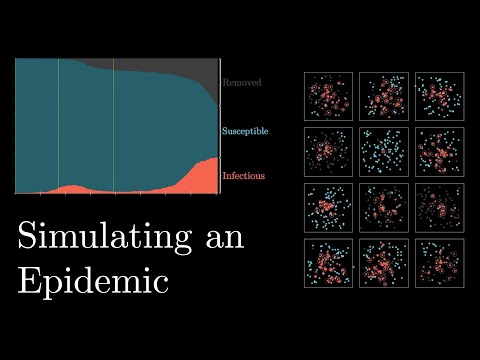

In [0]:
link = 'https://www.youtube.com/watch?v=gxAaO2rsdIs'

from IPython.display import YouTubeVideo
YouTubeVideo('gxAaO2rsdIs', width=1024, height=576)